Suivit du tuto : 

https://www.youtube.com/watch?v=sttf-Rgfl1Q

In [91]:
import os, sys, time
import numpy as np
import matplotlib.pyplot as plt

from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import ShuffleSplit, cross_val_score, train_test_split
from sklearn.metrics import accuracy_score
# from sklearn.utils import shuffle

import mne
from mne.channels import make_standard_montage
from mne.io import concatenate_raws, read_raw_edf
from mne.datasets import eegbci
from mne.decoding import CSP

from mne.preprocessing import ICA, corrmap
# from mne.viz import plot_events, plot_montage

import joblib

In [92]:

experiments = [
    {
        "description": "open and close left or right fist",
        "runs": [3, 7, 11],
        "mapping": {0: "rest", 1: "left fist", 2: "right fist"},
    },
    {
        "description": "imagine opening and closing left or right fist",
        "runs": [4, 8, 12],
        "mapping": {0: "rest", 1: "imagine left fist", 2: "imagine right fist"},
    },
    {
        "description": "open and close both fists or both feet",
        "runs": [5, 9, 13],
        "mapping": {0: "rest", 1: "both fists", 2: "both feets"},
    },
    {
        "description": "imagine opening and closing both fists or both feet",
        "runs": [6, 10, 14],
        "mapping": {0: "rest", 1: "imagine both fists", 2: "imagine both feets"},
    },
    {
        "description": "movement (real or imagine) of fists",
        "runs": [3, 7, 11, 4, 8, 12],
        "mapping": {0: "rest", 1: "left fist", 2: "right fist"},
    },
    {
        "description": "movement (real or imagine) of both fists or both feet",
        "runs": [5, 9, 13, 6, 10, 14],
        "mapping": {0: "rest", 1: "both fists", 2: "both feets"},
    },
]

In [93]:
path = os.getenv('HOME') + '/sgoinfre'

exp_set = 0
subject_nb = 3
experiment = experiments[exp_set]
raw_fnames = eegbci.load_data(subject_nb, experiment["runs"])
raw = concatenate_raws([read_raw_edf(f, preload=True) for f in raw_fnames])
sfreq = raw.info['sfreq']

Extracting EDF parameters from /home/clorin/sgoinfre/MNE-eegbci-data/files/eegmmidb/1.0.0/S003/S003R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /home/clorin/sgoinfre/MNE-eegbci-data/files/eegmmidb/1.0.0/S003/S003R07.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /home/clorin/sgoinfre/MNE-eegbci-data/files/eegmmidb/1.0.0/S003/S003R11.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


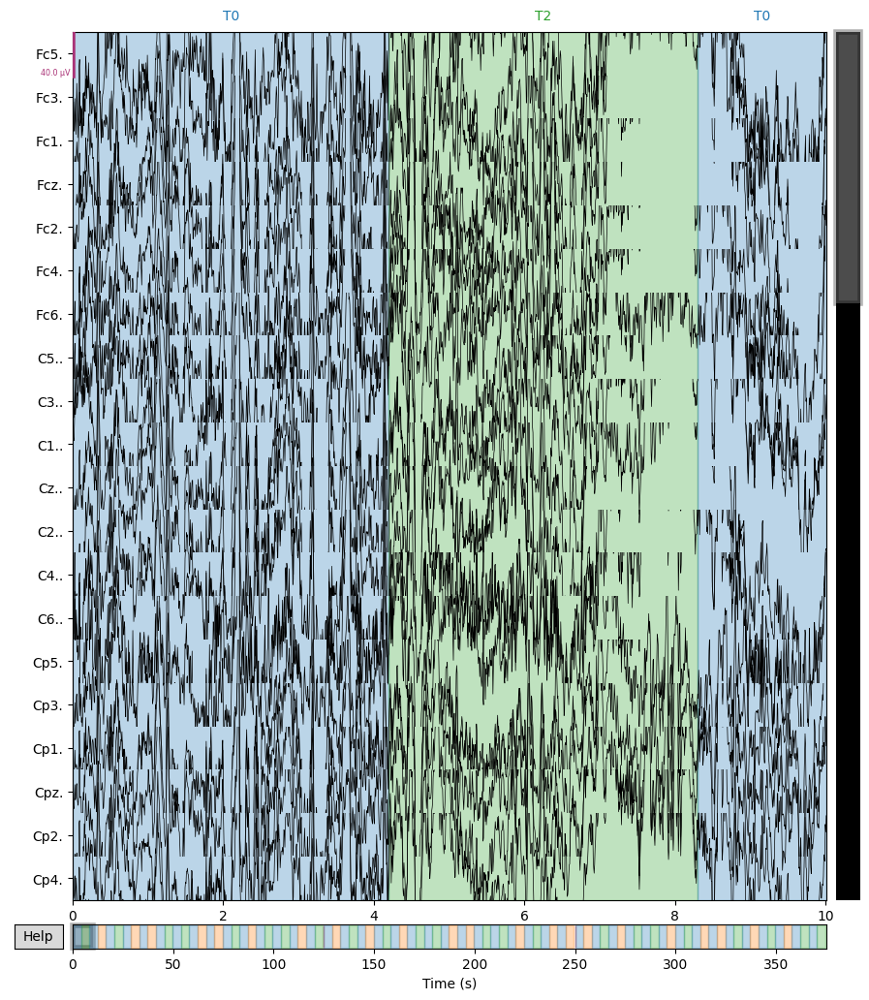

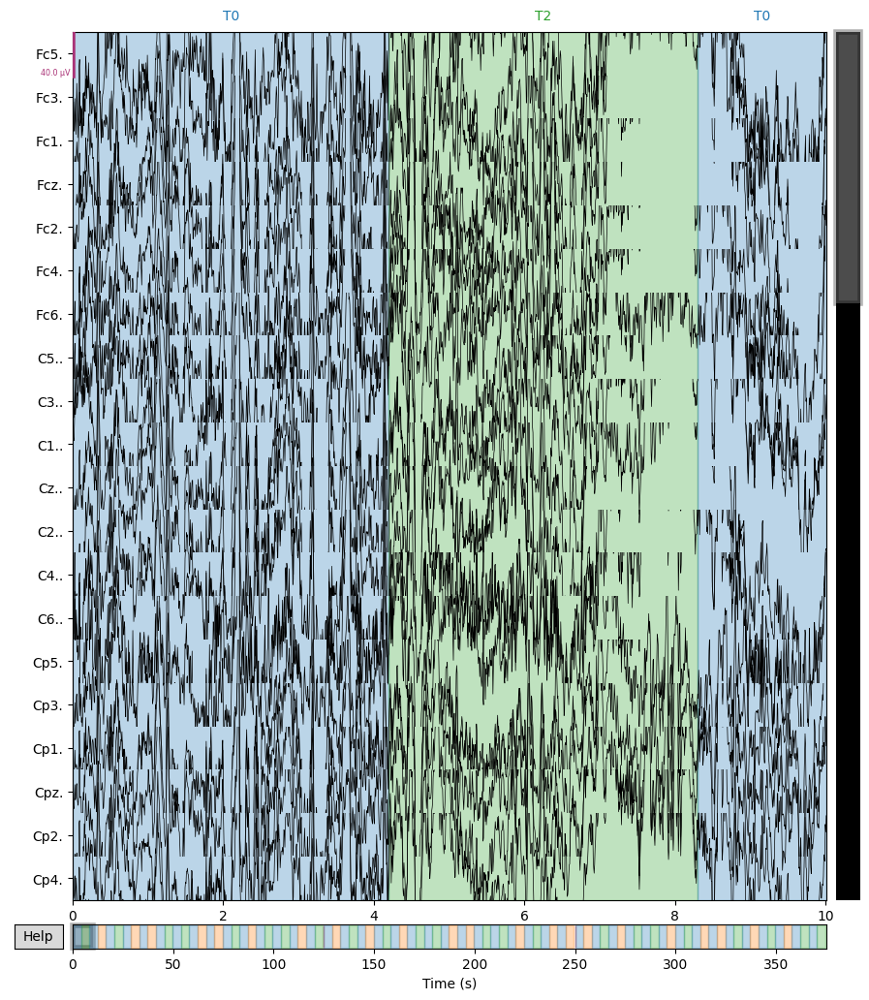

In [94]:
raw.plot()

In [95]:
events, event_id = mne.events_from_annotations(raw, event_id=dict(T1=1, T2=2))
annotations = mne.annotations_from_events(events=events, sfreq=sfreq, event_desc={0: "rest", 1: "left fist", 2:"right fist"}, verbose=True)
# raw = raw.set_annotations(annotations=annotations)
raw.filter(7.0, 30.0, fir_design="firwin", skip_by_annotation="edge")
# raw.filter(7.0, 30.0)
mne.datasets.eegbci.standardize(raw=raw)
# Montage
montage = mne.channels.make_standard_montage("biosemi64")
raw.set_montage(montage, on_missing='ignore')

Used Annotations descriptions: ['T1', 'T2']
Filtering raw data in 3 contiguous segments
Setting up band-pass filter from 7 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 7.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 6.00 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 265 samples (1.656 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    0.6s finished


<RawEDF | S003R03.edf, 64 x 60000 (375.0 s), ~29.4 MB, data loaded>

In [96]:
ica = ICA(n_components=20, random_state=0)
raw.drop_channels(['T9', 'T10'], on_missing='ignore')
ica.fit(raw.copy())

Fitting ICA to data using 62 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 10.1s.


Method,fastica
Fit,48 iterations on raw data (60000 samples)
ICA components,20
Available PCA components,62
Channel types,eeg
ICA components marked for exclusion,—


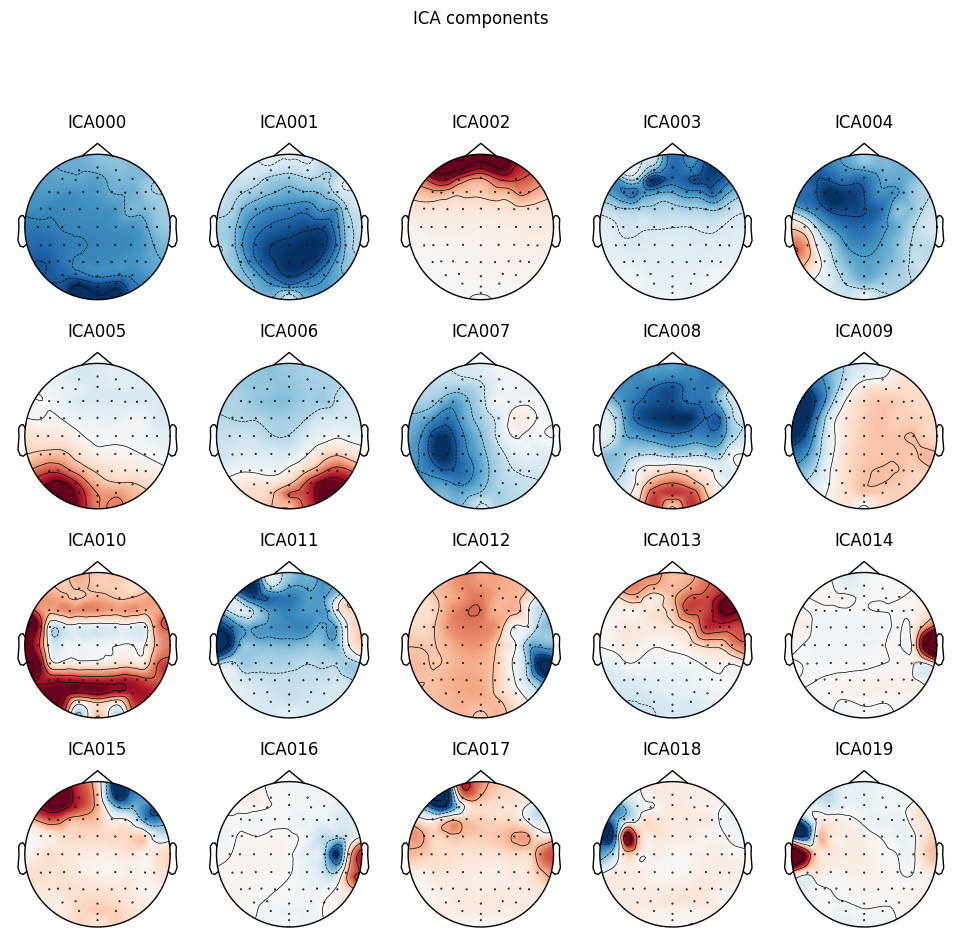

[<MNEFigure size 975x967 with 20 Axes>]

In [97]:
ica.plot_components(outlines='head', inst=raw)

In [98]:
ica.exclude=[15,18,19]
bad_idx, scores = ica.find_bads_eog(raw, ch_name="Fpz", threshold=2)
print(bad_idx)  

Using EOG channel: Fpz
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1600 samples (10.000 sec)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


[2, 3]


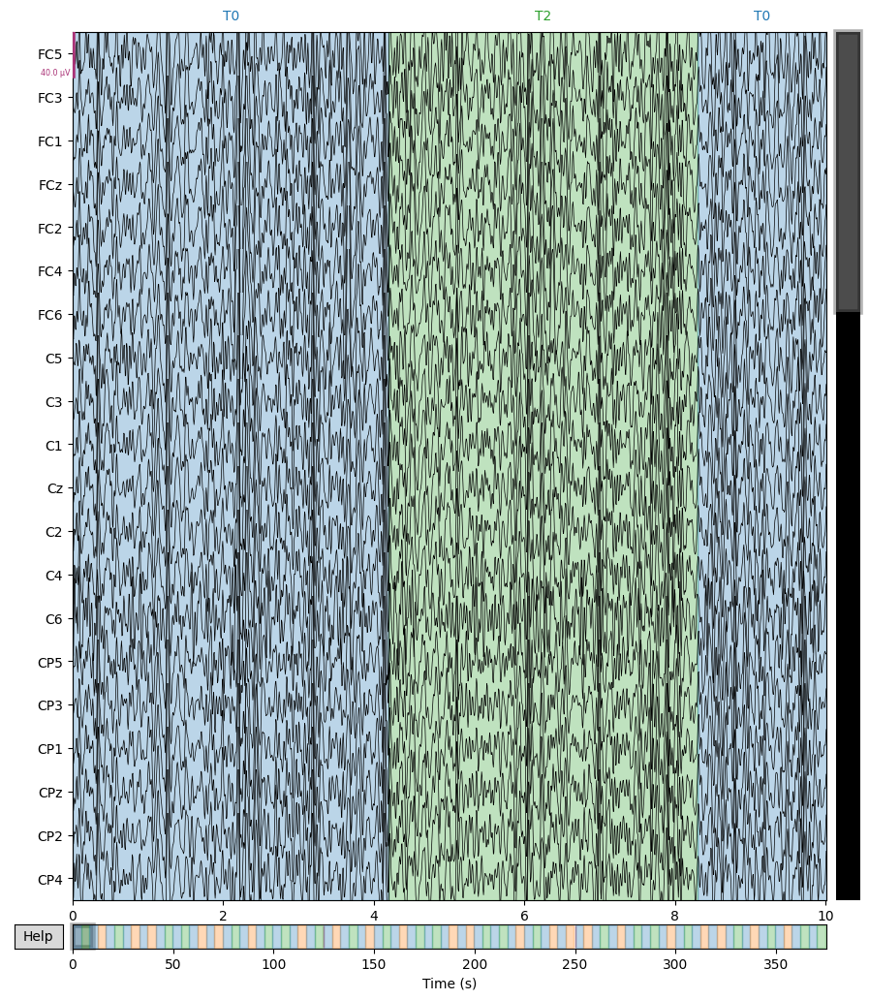

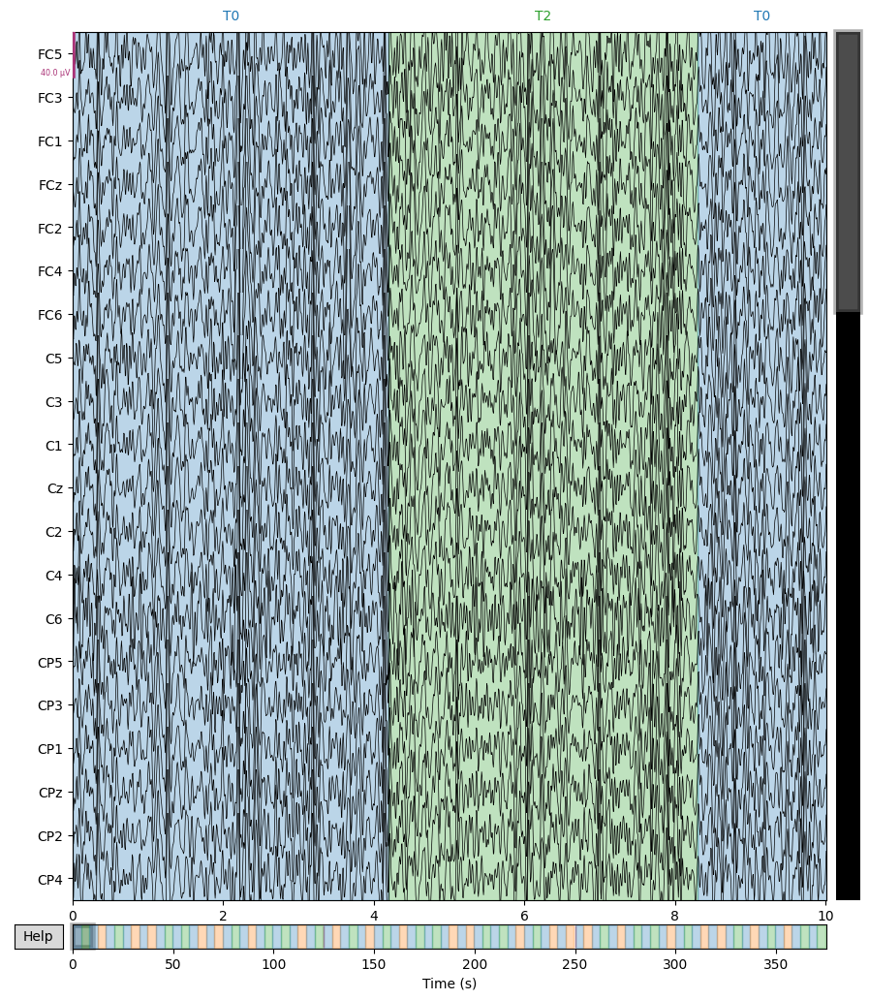

In [99]:
raw.plot()

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components


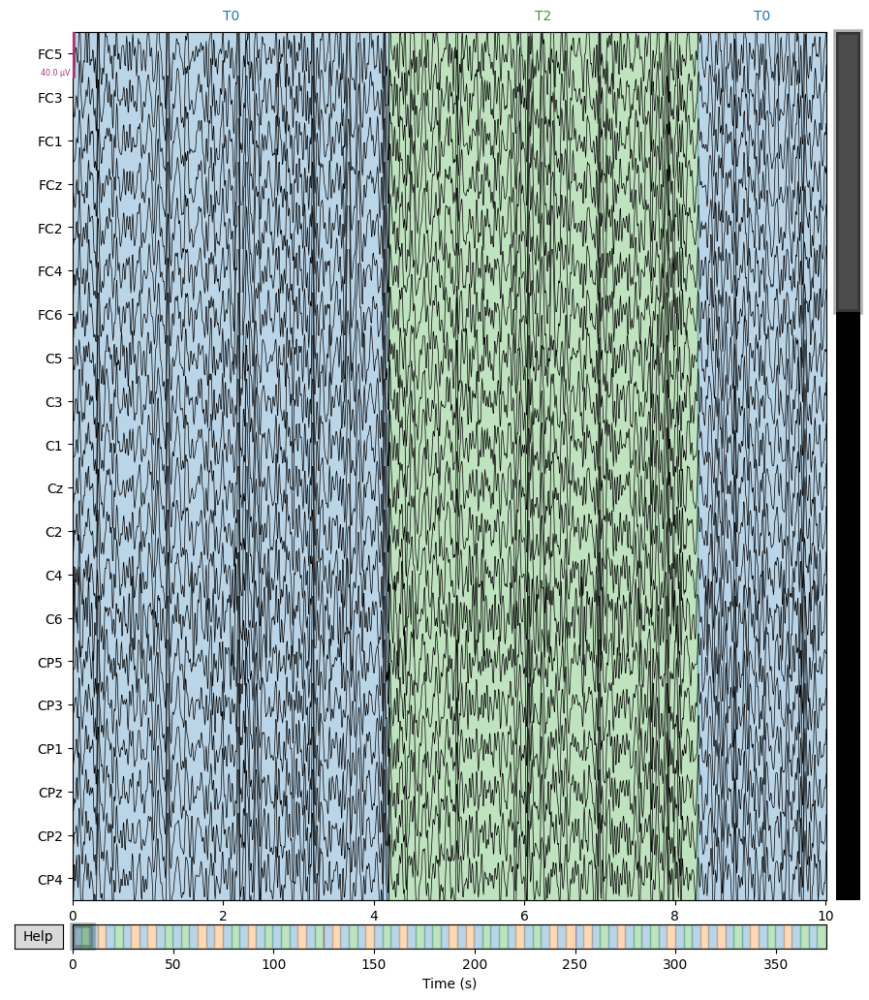

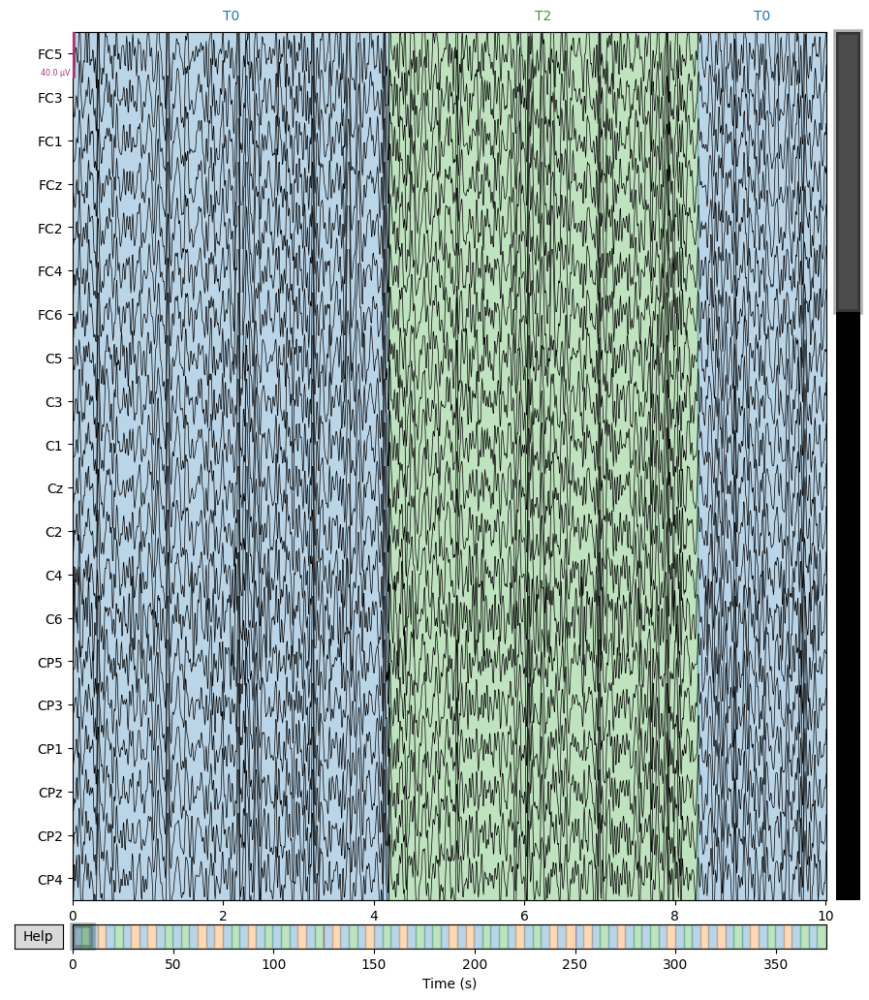

In [100]:
ica.apply(raw.copy(), exclude=ica.exclude).plot()

In [132]:
events, event_id = mne.events_from_annotations(raw, event_id=dict(T0=0, T1=1, T2=2))

Used Annotations descriptions: ['T0', 'T1', 'T2']


In [133]:
picks = mne.pick_types(raw.info, meg=False, eeg=True, stim=False, eog=False)
epochs = mne.Epochs(raw, events, event_id, -0.2, 0.5, proj=True, picks=picks, baseline=None, preload=True, verbose=50)
    

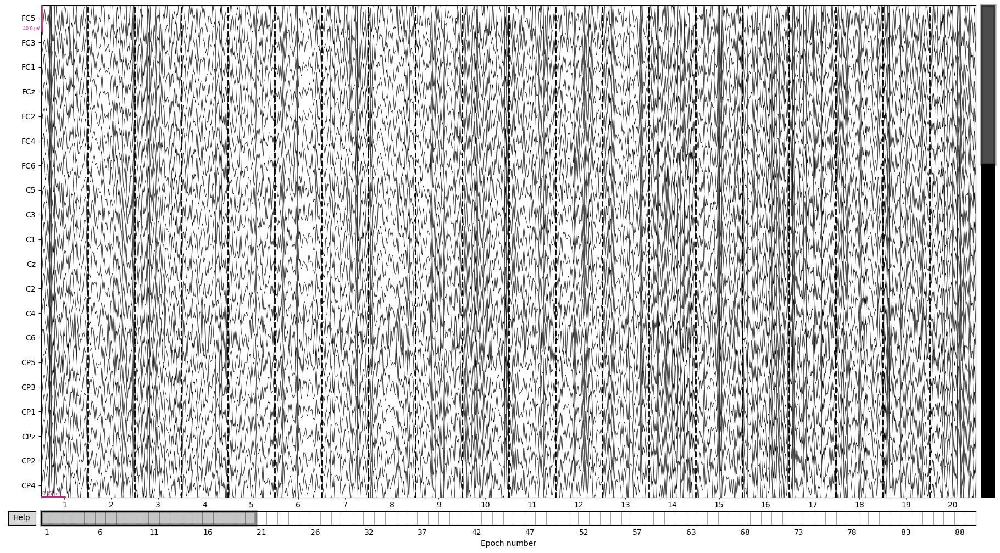

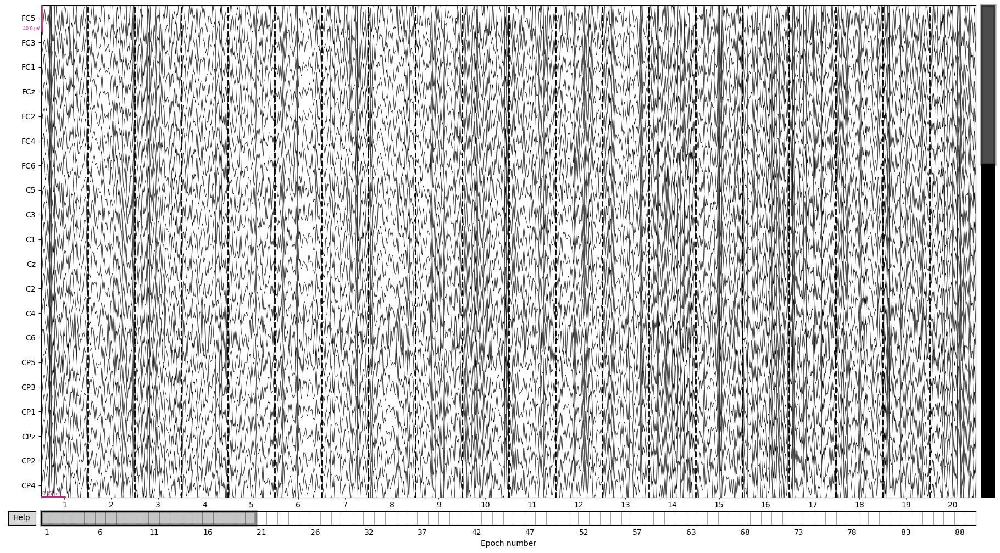

In [134]:
epochs.plot()

In [135]:
epochs = ica.apply(epochs, exclude=ica.exclude)

Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components


In [136]:
epochs.apply_baseline((None, 0))

Applying baseline correction (mode: mean)


Number of events,87
Events,T0: 42T1: 22T2: 23
Time range,-0.200 – 0.500 sec
Baseline,-0.200 – 0.000 sec


Not setting metadata
22 matching events found
No baseline correction applied
0 projection items activated


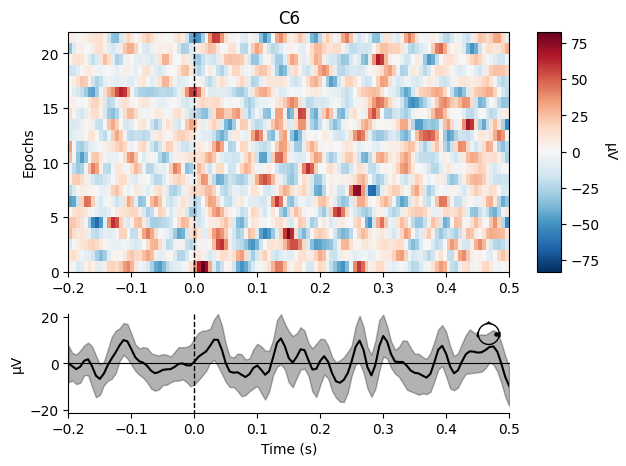

[<Figure size 640x480 with 4 Axes>]

In [137]:
epochs['T1'].plot_image(picks=[13])

In [138]:
epochs.equalize_event_counts(event_id)

Dropped 21 epochs: 1, 5, 11, 13, 19, 23, 25, 32, 36, 40, 42, 48, 50, 61, 65, 67, 71, 77, 81, 85, 86


(<Epochs |  66 events (all good), -0.2 - 0.5 sec, baseline -0.2 – 0 sec, ~3.6 MB, data loaded,
  'T0': 22
  'T1': 22
  'T2': 22>,
 array([ 1,  5, 11, 13, 19, 23, 25, 32, 36, 40, 42, 48, 50, 61, 65, 67, 71,
        77, 81, 85, 86]))

Not setting metadata
22 matching events found
No baseline correction applied
0 projection items activated


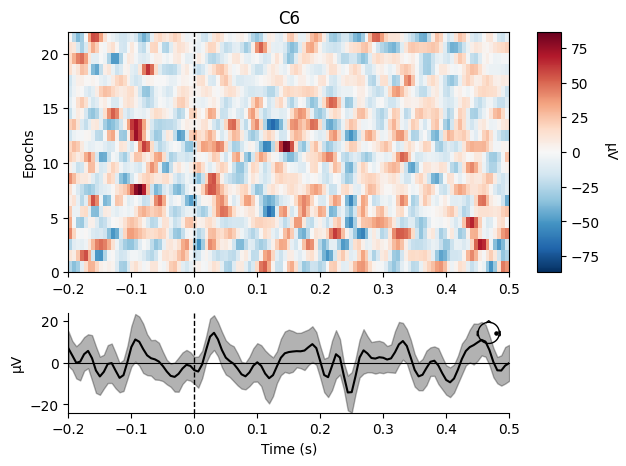

[<Figure size 640x480 with 4 Axes>]

In [139]:
epochs['T1'].plot_image(picks=[13])

In [140]:
epochs.info

<Info | 8 non-empty values
 bads: []
 ch_names: FC5, FC3, FC1, FCz, FC2, FC4, FC6, C5, C3, C1, Cz, C2, C4, C6, ...
 chs: 62 EEG
 custom_ref_applied: False
 dig: 65 items (3 Cardinal, 62 EEG)
 highpass: 7.0 Hz
 lowpass: 30.0 Hz
 meas_date: 2009-08-12 16:15:00 UTC
 nchan: 62
 projs: []
 sfreq: 160.0 Hz
>

In [142]:
epochs.save("essais2-epo.fif")

In [144]:
T0 = epochs["T0"].average()
T1 = epochs["T1"].average()
T2 = epochs["T2"].average()


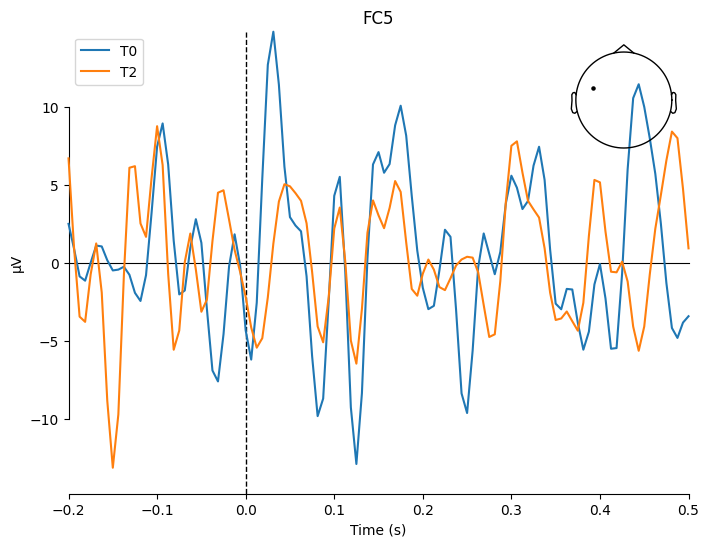

[<Figure size 800x600 with 2 Axes>]

In [146]:
mne.viz.plot_compare_evokeds({"T0":T0, "T2": T2}, picks=[0])

No projector specified for this dataset. Please consider the method self.add_proj.


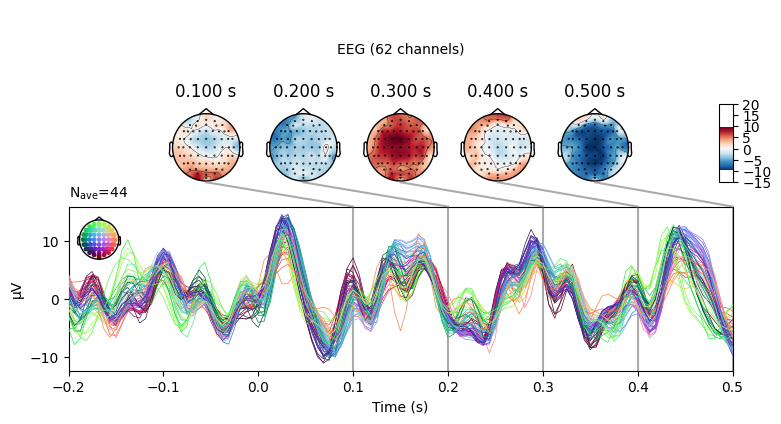

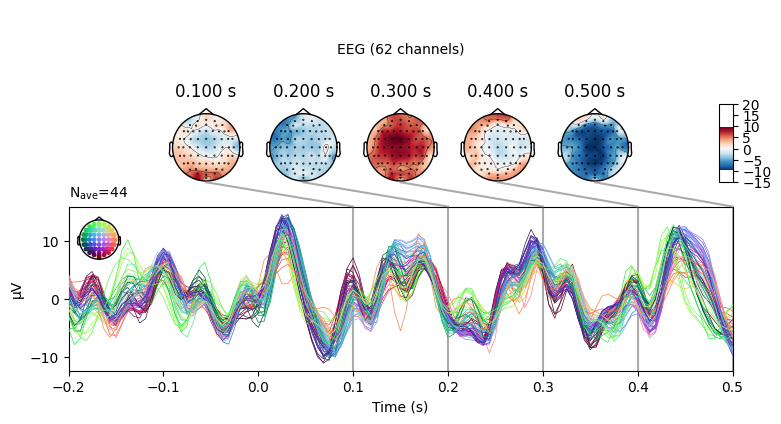

In [147]:
diff = mne.combine_evoked((T1, T0), weights='equal')
diff.plot_joint(times=[0.1,0.2,0.3,0.4,0.5])